## Vehicle detection and tracking Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.


#### Import python modules

In [1]:
import numpy as np
import random
import cv2
import glob
import pickle
import time
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from skimage.feature import hog
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from scipy.ndimage.measurements import label

%matplotlib inline

In [2]:
#Use this to convert dataset in jpg format to avoid issues dealing with png
def png2jpg():
    images = glob.glob('training_data/**/*.png', recursive=True)

    for image in images:
        cv2.imwrite(image[:-3] + "jpg", cv2.imread(image))

In [3]:
def imread(path):
    image = mpimg.imread(path)
    return image

'''
Multiple try out did to resolve image/video read
    #image = cv2.imread(path)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #image = cv2.imwrite("temp.jpg", image)
    #image = cv2.imread("temp.jpg")
    
    
   # print (image)
 #   image = image.astype(np.float32)/255
  #  image = image * 255
   # image = image.astype(np.uint8)
'''   

'\nMultiple try out did to resolve image/video read\n    #image = cv2.imread(path)\n    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)\n    #image = cv2.imwrite("temp.jpg", image)\n    #image = cv2.imread("temp.jpg")\n    \n    \n   # print (image)\n #   image = image.astype(np.float32)/255\n  #  image = image * 255\n   # image = image.astype(np.uint8)\n'

### Data exploration

count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: uint8


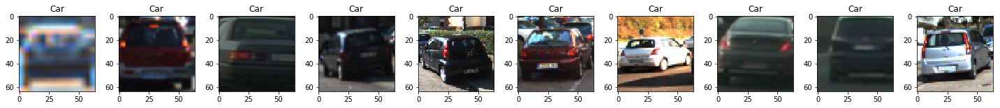

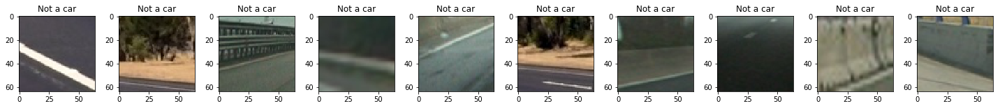

In [4]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    
    data_dict["cars"] = car_list
    data_dict["not_cars"] = notcar_list
    # Return data_dict
    return data_dict

def read_training_data():

    images = glob.glob('training_data/**/*.jpg', recursive=True)
    cars = []
    notcars = []

    for image in images:
        if 'non-vehicles' in image:
            notcars.append(image)
           # print (image)
        else:
          #  print(image)
            cars.append(image)

    
    cars = random.sample(cars, int(len(cars)/1))
    notcars = random.sample(notcars, int(len(notcars)/1))
    
    return data_look(cars, notcars)

def summary_data(data_info):
    print('count of', 
          data_info["n_cars"], ' cars and', 
          data_info["n_notcars"], ' non-cars')
    print('of size: ',data_info["image_shape"], ' and data type:', 
          data_info["data_type"])
    # Just for fun choose random car / not-car indices and plot example images   
    car_ind = np.random.randint(0, data_info["n_cars"])
    notcar_ind = np.random.randint(0, data_info["n_notcars"])

    # Read in car / not-car images
    cars = data_info["cars"]
    notcars = data_info["not_cars"]
    car_image = imread(cars[car_ind])
    notcar_image = imread(notcars[notcar_ind])
     
    # Plot the examples
    fig = plt.figure(figsize=(20,10))
    for i in range(10):
        car_ind = np.random.randint(0, data_info["n_cars"])
        cars = data_info["cars"]
        car_image = imread(cars[car_ind])
        plt.subplot(1, 10, i+1)
        plt.imshow(car_image)
        plt.title('Car')
    fig.tight_layout()
   # plt.show()
    plt.savefig("./output_images/car.png")
    
    fig = plt.figure(figsize=(20,10))
    for i in range(10):
        notcar_ind = np.random.randint(0, data_info["n_notcars"])
        notcars = data_info["not_cars"]
        notcar_image = imread(notcars[notcar_ind])
        
        plt.subplot(1, 10, i+1)
        plt.imshow(notcar_image)
        plt.title('Not a car')
    fig.tight_layout()
   # plt.show()
    plt.savefig("./output_images/not_car.png")
    
    
data_dict = read_training_data()
summary_data(data_dict)

### Explore HoG features

In [5]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  block_norm= 'L2-Hys',
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [6]:
def HoGExample():
    # Plot the examples
    
    j = 1
    fig = plt.figure(figsize=(128, 128))
    for i in range(10):
        car_ind = np.random.randint(0, data_dict["n_cars"])
        cars = data_dict["cars"]
        car_image = imread(cars[car_ind])
        gray = cv2.cvtColor(car_image, cv2.COLOR_RGB2GRAY)
        
        plt.subplot(10, 4, j)
        plt.imshow(car_image, cmap='gray')
        plt.title('Car')
    
    
        features, hog_image = get_hog_features(gray, orient= 9, 
                            pix_per_cell= 8, cell_per_block= 2, 
                            vis=True, feature_vec=False)

    
    
    
        plt.subplot(10, 4, j + 1)
        plt.imshow(hog_image, cmap='gray')
        plt.title('HoG for car')
        
        
        n_car_ind = np.random.randint(0, data_dict["n_notcars"])
        nocars = data_dict["not_cars"]
        not_car_image = imread(nocars[n_car_ind])
        gray = cv2.cvtColor(not_car_image, cv2.COLOR_RGB2GRAY)
        
        plt.subplot(10, 4, j + 2)
        plt.imshow(not_car_image, cmap='gray')
        plt.title('Not Car')
    
    
        features, hog_image = get_hog_features(gray, orient= 9, 
                            pix_per_cell= 8, cell_per_block= 2, 
                            vis=True, feature_vec=False)

        plt.subplot(10, 4, j + 3)
        plt.imshow(hog_image, cmap='gray')
        plt.title('HoG for NOT car')
        
        j = j + 4
        
    fig.tight_layout()
    plt.savefig("./output_images/HOG_example.jpg")
    plt.show()
    
HoGExample()


### Feature extraction

In [7]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = imread(file)
        feature_image = np.copy(image)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [8]:
def features(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
             spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat):
    cars = data_dict["cars"]
    notcars = data_dict["not_cars"]
    
    car_features = extract_features(cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    notcar_features = extract_features(notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    # Define a labels vector based on features lists
    y = np.hstack((np.ones(len(car_features)), 
              np.zeros(len(notcar_features))))
    
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)
    
    return X, y

### Finalized parameter

In [9]:

color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off

#### Extract features

In [10]:

hog_feat = True # HOG features on or off

t=time.time()
X, y = features(color_space, orient, pix_per_cell, cell_per_block,
                hog_channel, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

t2 = time.time()
print(round(t2 - t, 2), 'Time required to extract features')

147.62 Time required to extract features


#### Split data into training and testing

In [11]:
def split_data():
    
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    
    X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
    return X_train, X_test, y_train, y_test


#### Normalize data before use

In [12]:
def normalize():
    X_train, X_test, y_train, y_test = split_data()
    
  #  X_train = np.asarray(X_train).astype(np.float64)
   # X_test = np.asarray(X_test).astype(np.float64)
    # Fit a per-column scaler only on the training data
    X_scaler = StandardScaler().fit(X_train)
    
    # Apply the scaler to both X_train and X_test
    scaled_X_train = X_scaler.transform(X_train)
    scaled_X_test = X_scaler.transform(X_test)
    
    return X_scaler, scaled_X_train, scaled_X_test, y_train, y_test
    

In [13]:
X_scaler, X_train, X_test, y_train, y_test = normalize()

#### Linear SVC classifier

In [14]:
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')


29.22 Seconds to train SVC...


#### Check accuracy of SVM

In [15]:
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Test Accuracy of SVC =  0.9893
My SVC predicts:  [ 0.  1.  1.  0.  0.  0.  1.  1.  1.  0.]
For these 10 labels:  [ 0.  1.  1.  0.  0.  0.  1.  1.  1.  0.]
0.0166 Seconds to predict 10 labels with SVC


#### Classfier parameter tunning

In [16]:
#Classify tunning

def classify_tune():
    parameters = {'C':[0.5, 1, 5]}
    
    t=time.time()
    clf = GridSearchCV(svc, parameters)
    clf.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to SVC parameter tuning')
    print (clf.best_params_)
    return clf

clf = classify_tune()

171.12 Seconds to SVC parameter tuning
{'C': 0.5}


#### save training parameters for future purpose

In [17]:
trained_pickle = {
    "clf" : clf,
    "X_scaler" : X_scaler,
    "color_space" : color_space,
    "orient" : orient,
    "pix_per_cell" : pix_per_cell, # HOG pixels per cell
    "cell_per_block" : cell_per_block, # HOG cells per block
    "hog_channel" : hog_channel, # Can be 0, 1, 2, or "ALL"
    "spatial_size" : spatial_size, # Spatial binning dimensions
    "hist_bins" : hist_bins,    # Number of histogram bins
    "spatial_feat" : spatial_feat, # Spatial features on or off
    "hist_feat" : hist_feat, # Histogram features on or off
    "hog_feat" : hog_feat, # HOG features on or off
}
pickle.dump(trained_pickle, open( "./output_images/trained_pickle.p", "wb" ) )


##  Prediction cycle

#### Fetch saved train data

In [18]:

trained_pickle = pickle.load(open( "./output_images/trained_pickle.p", "rb") )
print (trained_pickle)

clf = trained_pickle["clf"]
X_scaler = trained_pickle["X_scaler"]
color_space = trained_pickle["color_space"]
orient = trained_pickle["orient"]
pix_per_cell = trained_pickle["pix_per_cell"]
cell_per_block = trained_pickle["cell_per_block"]
hog_channel = trained_pickle["hog_channel"]
spatial_size = trained_pickle["spatial_size"]
hist_bins = trained_pickle["hist_bins"]
spatial_feat = trained_pickle["spatial_feat"]
hist_feat = trained_pickle["hist_feat"]
hog_feat = trained_pickle["hog_feat"]

{'hist_bins': 32, 'spatial_feat': True, 'pix_per_cell': 8, 'orient': 9, 'X_scaler': StandardScaler(copy=True, with_mean=True, with_std=True), 'hog_channel': 'ALL', 'clf': GridSearchCV(cv=None, error_score='raise',
       estimator=LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0),
       fit_params=None, iid=True, n_jobs=1, param_grid={'C': [0.5, 1, 5]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0), 'cell_per_block': 2, 'spatial_size': (32, 32), 'hog_feat': True, 'hist_feat': True, 'color_space': 'YCrCb'}


### A. Sliding window approach to find car

In [19]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [20]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


#### Single frame extractor

In [21]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    feature_image = np.copy(img)
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)   

In [22]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

#### Sliding window verification on test images

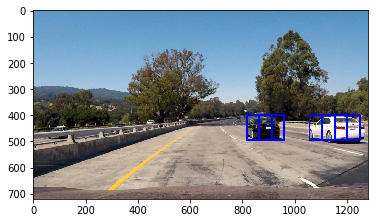

In [23]:
def verify_sliding_window():
    image = imread('./test_images/test1.jpg')
    draw_image = np.copy(image)
    y_start_stop = [400, 670]
        
    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(96, 96), xy_overlap=(0.5, 0.5))
    hot_windows = search_windows(image, windows, clf, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    plt.imshow(window_img)
    plt.savefig("./output_images/sliding_window.jpg")
    
verify_sliding_window()

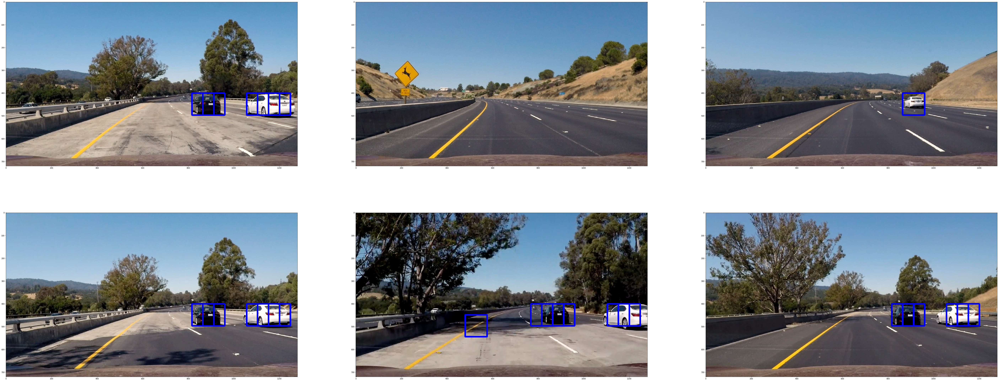

In [24]:
def verify_sliding_window_pipeline():
    images = glob.glob('./test_images/*.jpg', recursive=True)
    total_images = len(images)
    i = 1
    fig = plt.figure(figsize=(100,40))
    for image in images:
        image = imread(image)
        draw_image = np.copy(image)
        y_start_stop = [400, 670]
        
        windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(96, 96), xy_overlap=(0.5, 0.5))
        hot_windows = search_windows(image, windows, clf, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

        plt.subplot(2, total_images / 2, i)
        plt.imshow(window_img)
        plt.savefig("./output_images/sliding_windows.jpg")
        i = i + 1

verify_sliding_window_pipeline()

In [25]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)


### B. Hog sub sampling and feature extraction for prediction

In [26]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
   # color_space = 'RGB2YCrCb'
    
    draw_img = np.copy(img)
    
    rectangles = []
 #   img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return draw_img, rectangles

In [27]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
     #   print(box)

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
   # print (labels[1]+1)
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def get_labeled_bboxes(labels):
    # Iterate through all detected cars
    b_heat=[] #((x1,y1),(x2,y2))

    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        b_heat.append(bbox)

    return b_heat

def get_heatmap(image, box_list, threshold=1, showImg = True):
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    if showImg ==  True:
        return draw_labeled_bboxes(np.copy(image), labels), heatmap
    else:
        return get_labeled_bboxes(labels), heatmap
        

#### HeatMap verifier

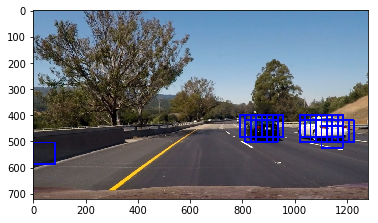

In [28]:
def Verify_find_car():
        
    ystart = 400
    ystop = 600
    scale = 1.3
    image = imread('./test_images/test6.jpg')
    out_img, box_list = find_cars(image, ystart, ystop, scale, clf, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    plt.imshow(out_img)
    plt.savefig("./output_images/hog_subsampling.jpg")
    
Verify_find_car()
    
    

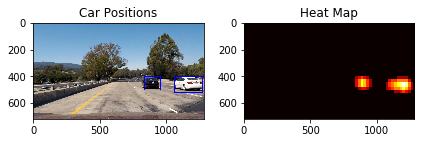

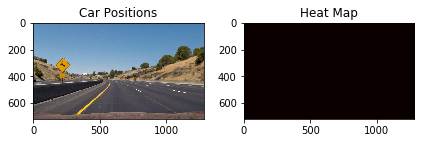

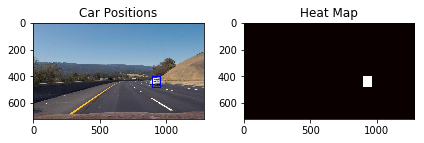

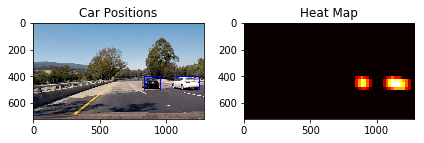

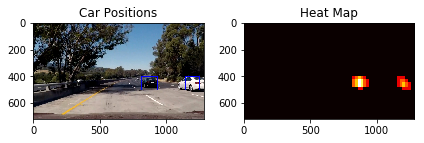

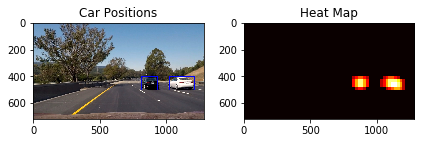

In [29]:
def verify_heatmap(image):
    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    ystart = 400
    ystop = 600
    scale = 1.3

    out_img, box_list = find_cars(image, ystart, ystop, scale, clf, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    draw_img, heatmap = get_heatmap(image, box_list, 1, True)

    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(draw_img)
    plt.title('Car Positions')
    plt.subplot(122)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map')
    fig.tight_layout()
    plt.savefig("./output_images/bboxes_and_heat.png")

def verify_heatmaps():
    images = glob.glob('./test_images/*.jpg', recursive=True)
    
    for path in images:
        image = imread(path)
        verify_heatmap(image)
verify_heatmaps()

#### Pipeline image processor

In [30]:
def get_rects(img):
    loops = [[400, 480, 1], [440, 530, 1.5], [500, 560, 2], [570, 670, 2.5]]

    boxes = []
    for i in range(len(loops)):
        loop = loops[i]
        out_img, box_list = find_cars(img, loop[0], loop[1], loop[2], clf, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes.append(box_list)
   
    rectangles = []
    for sublist in boxes:
        for item in sublist:
            rectangles.append(item)
    return rectangles

In [31]:
def process_img(img3):
    #loops = [[400, 650, 1]]
    #loops = [[400, 510, 1], [430, 560, 1.5], [500, 670, 2]]
  #  loops = [(380, 480, 1), (400, 600, 1.5), (500, 700, 2.5)]

    rectangles = get_rects(img3)
    
    out_img, heatmap = get_heatmap(img3, rectangles, 2, True)
    return out_img

#### Verify test images 

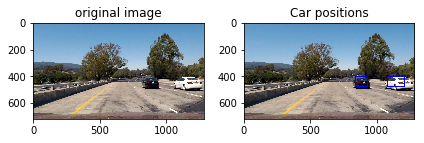

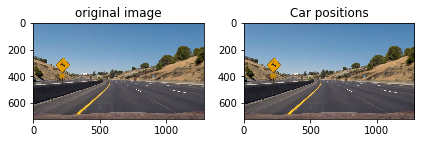

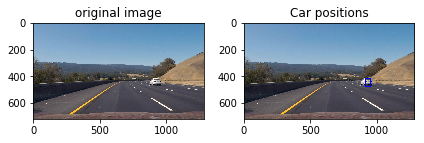

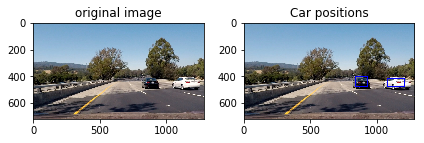

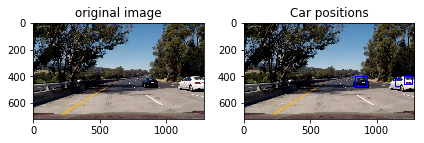

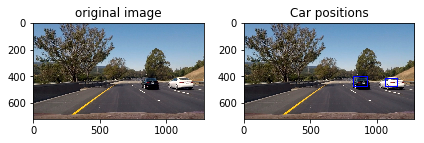

In [32]:
def verify_pipeline_wrapper():
    images = glob.glob('./test_images/*.jpg')
         
    for image_path in images:
        img4 = imread(image_path)
        out_img4 = process_img(img4)
        fig = plt.figure()
        plt.subplot(121)
        plt.imshow(img4)
        plt.title('original image')
        plt.subplot(122)
        plt.imshow(out_img4)
        plt.title('Car positions')
        fig.tight_layout()
        plt.savefig("./output_images/output_bboxes.png")
verify_pipeline_wrapper()

### Video Pipeline 

#### Pipeline wrapper to process video frames

In [33]:
def process_video(img):
    global counter
    global bbox_frames
    
    counter+=1
    countFrame = counter % nframes
    
    rectangles = get_rects(img)
    
    #Added smoothing with reference to https://chatbotslife.com/vehicle-detection-and-tracking-using-computer-vision-baea4df65906
    #Find heatmap single image
    thres = smooth_thres

    boxes, heatmap = get_heatmap(img,rectangles, thres, False)
    #Store the rectangles of the frame
    bbox_frames[countFrame] = boxes
    
    #Sum rectangles of the nframes
    bbox2=[]
    for box in bbox_frames:
        if box!=0:
            for b in box:
                bbox2.append(b)
    
    #Find heatmap of average
    thres = smooth_average
    out_img, heatmap = get_heatmap(img, bbox2, thres, True)
    return out_img
    
    

#### Video process

In [34]:
counter=0
nframes = 20
smooth_thres = 2.5
smooth_average= 10

bbox_frames=[]
#Inicialization of list
for i in range(nframes):
    bbox_frames.append(0)
counter = 0


yellow_output = 'output_images/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
yellow_clip = clip1.fl_image(process_video)
%time yellow_clip.write_videofile(yellow_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [10:31<00:00,  1.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

Wall time: 10min 33s
